# Denoising Diffusion Implicit Models for the Oxford Flowers 102 Dataset 

## Introduction

### Oxford Flowers 102 Dataset

https://www.robots.ox.ac.uk/~vgg/data/flowers/102/

102 category dataset, consisting of 102 flower categories. The flowers chosen to be flower commonly
occuring in the United Kingdom. Each class consists of between 40 and 258 images. The images have 
large scale, pose and light variations. In addition, there are categories that have large variations
within the category and several very similar categories.

There are a total of 8189 images, a total download in ~330Mb.

More information in the TensorFlow Datasets page:

https://www.tensorflow.org/datasets/catalog/oxford_flowers102


The package [github.com/gomlx/gomlx/examples/oxfordflowers102](http://github.com/gomlx/gomlx/examples/oxfordflowers102)
provides a `train.Dataset` object that can be used to train models with the dataset. It also provides a simplified
mechanism to download and cache the dataset.

### Denoising Diffusion Implicit Models

This notebook is an example of a diffusion model, bsed on he Keras example in:

https://keras.io/examples/generative/ddim/

The modeling and training code is in [github.com/gomlx/gomlx/examples/oxfordflowers102/diffusion](https://github.com/gomlx/gomlx/tree/main/examples/oxfordflowers102/diffusion). 
There is a training binary for the commandline in the `train/` subdirectory, it's a very small wrapper of the `diffusion` library.

In [6]:
!*rm -f go.work && go work init && go work use . "${HOME}/Projects/gomlx"
%goworkfix

	- Replace rule for module "github.com/gomlx/gomlx" to local directory "/home/janpf/Projects/gomlx" already exists.


## Hyperparameters and Configuration

Some basic parameters are set as flags, but everything else are set as parameters in the `context.Contex`. The hyperparameters can be configured using the `--set` command-line flag.

Below we define the `ContextFromSettings` that we are going to use everywhere, and we print out the available hyperparameters.

See [`diffusion.CreateDefaultContext`](https://github.com/gomlx/gomlx/blob/main/examples/oxfordflowers102/diffusion/parameters.go) for documentation on all hyperparameters.

In [7]:
import (
    "github.com/gomlx/gomlx/examples/oxfordflowers102/diffusion"
    "github.com/gomlx/gomlx/pkg/ml/context"

    // Include backends.
    _ "github.com/gomlx/gomlx/backends/default"
)

var (
	flagDataDir    = flag.String("data", "~/work/oxfordflowers102", "Directory to cache downloaded and generated dataset files.")
	flagEval       = flag.Bool("eval", true, "Whether to evaluate the model on the validation data in the end.")
	flagVerbosity  = flag.Int("verbosity", 1, "Level of verbosity, the higher the more verbose.")
	flagCheckpoint = flag.String("checkpoint", "", "Directory save and load checkpoints from. If left empty, no checkpoints are created.")

    // settings is bound to a "-set" flag to be used to set context hyperparameters.
    settings = commandline.CreateContextSettingsFlag(diffusion.CreateDefaultContext(), "set")
)

// ContextFromSettings is the default context (createDefaultContext) changed by -set flag.
// It requires that flags are already parsed.
//
// It also returns the list of parameters that were set.
func ContextFromSettings() (ctx *context.Context, paramsSet[]string) {
    ctx = diffusion.CreateDefaultContext()
    paramsSet = must.M1(commandline.ParseContextSettings(ctx, *settings))
    return
}

// ConfigFromSettings returns a diffusion.Config object initilized from the settings.
// It requires that flags are already parsed.
func ConfigFromFlags() *diffusion.Config {
    backend := backends.MustNew()
    ctx, paramsSet := ContextFromSettings()
    return diffusion.NewConfig(backend, ctx, *flagDataDir, paramsSet)
}

%% -set="dtype=float32;train_steps=1_000"
c := ConfigFromFlags()
fmt.Println(commandline.SprintContextSettings(c.Context))

	"/activation": (string) swish
	"/adam_dtype": (string) 
	"/adam_epsilon": (float64) 1e-07
	"/adam_weight_decay": (float64) 0.0001
	"/batch_size": (int) 32
	"/checkpoint_frequency": (string) 3m
	"/cosine_annealing_min_learning_rate": (float64) 1e-05
	"/cosine_schedule_steps": (int) 0
	"/diffusion_balanced_dataset": (bool) false
	"/diffusion_channels_list": ([]int) [32 64 96 128]
	"/diffusion_ema": (float64) 0.999
	"/diffusion_loss": (string) mse
	"/diffusion_max_signal_ratio": (float64) 0.95
	"/diffusion_min_signal_ratio": (float64) 0.02
	"/diffusion_num_residual_blocks": (int) 4
	"/diffusion_pool": (string) mean
	"/diffusion_residual_version": (int) 2
	"/dropout_rate": (float64) 0.15
	"/dtype": (string) float32
	"/eval_batch_size": (int) 128
	"/flower_type_embed_size": (int) 16
	"/huber_delta": (float64) 0.2
	"/image_size": (int) 64
	"/kid": (bool) false
	"/l1_regularization": (float64) 0
	"/l2_regularization": (float64) 0
	"/learning_rate": (float64) 0.001
	"/loss": (string) 
	"/nan_

## Dataset Management

### Data directory and downloading the dataset

Bellow we call `DownloadAndParse`: it will only download if dataset files are not yet downloaded, otherwise it's a no-op.

This cell also defines some flags we will use later everywhere.

In [8]:
import (
    "flag"
    flowers "github.com/gomlx/gomlx/examples/oxfordflowers102"
    "github.com/janpfeifer/must"
)

%%
c := ConfigFromFlags()
must.M(flowers.DownloadAndParse(c.DataDir))
fmt.Println("Oxford Flowers 102 dataset downloaded:")
fmt.Printf("\t%d images, %d labels, %d examples\n", len(flowers.AllImages), len(flowers.AllLabels), flowers.NumExamples)


Oxford Flowers 102 dataset downloaded:
	8189 images, 8189 labels, 8189 examples


### Sample of Flowers

To do that we create a temporry dataset (with `NewDataset`) of size 256x256 pixels, and then show a sample of the flowers.

Later we will use a model that uses only 64x64 pixels.

Example 1357:petunia (50)(256x256 pixels),Example 911:frangipani (80)(256x256 pixels),Example 3209:californian poppy (64)(256x256 pixels),Example 1006:wallflower (45)(256x256 pixels),Example 198:passion flower (76)(256x256 pixels),Example 2586:columbine (83)(256x256 pixels)
Example 530:cyclamen (87)(256x256 pixels),Example 1396:petunia (50)(256x256 pixels),Example 390:water lily (72)(256x256 pixels),Example 8041:blackberry lily (101)(256x256 pixels),Example 2140:thorn apple (74)(256x256 pixels),Example 1701:hibiscus (82)(256x256 pixels)
Example 613:watercress (88)(256x256 pixels),Example 2829:bishop of llandaff (55)(256x256 pixels),Example 1027:wallflower (45)(256x256 pixels),Example 4022:colt's foot (11)(256x256 pixels),Example 4585:lenten rose (39)(256x256 pixels),Example 53:passion flower (76)(256x256 pixels)
Example 1407:petunia (50)(256x256 pixels),Example 733:watercress (88)(256x256 pixels),Example 1199:rose (73)(256x256 pixels),Example 5432:sunflower (53)(256x256 pixels),Example 4810:desert-rose (84)(256x256 pixels),Example 7971:trumpet creeper (100)(256x256 pixels)

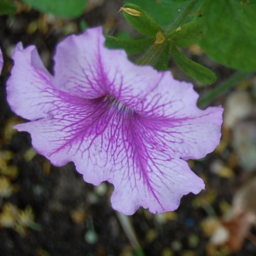
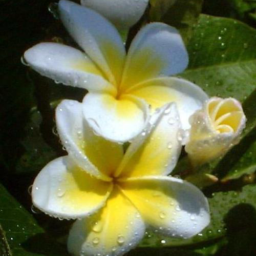
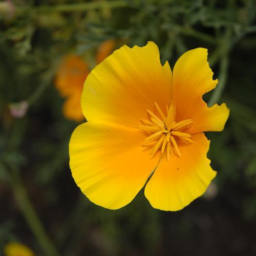
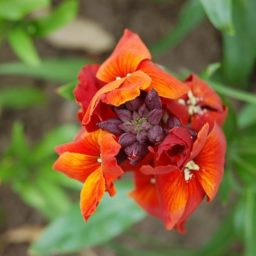
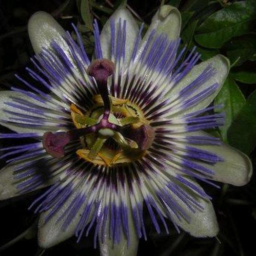
...
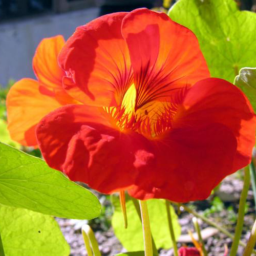
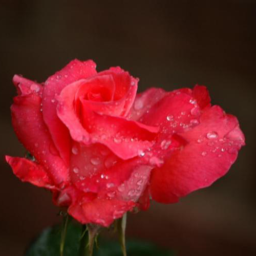
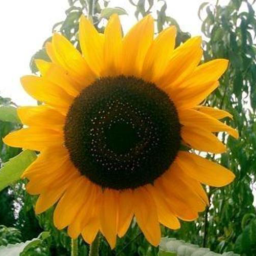
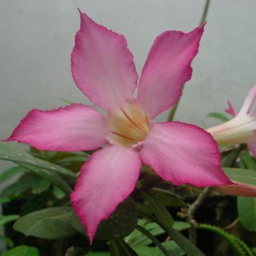
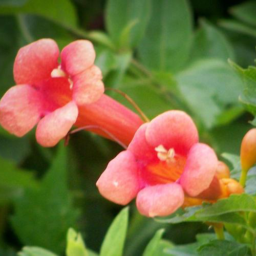

In [9]:
import (
    timage "github.com/gomlx/gomlx/pkg/core/tensors/images"
)

// sampleTable generates and outputs one html table of samples, sampling rows x cols from the images/labels provided.
func sampleTable(title string, ds train.Dataset, rows, cols int) {
    htmlRows := make([]string, 0, rows)
    for row := 0; row < rows; row++ {
        cells := make([]string, 0, cols)
        for col := 0; col < cols; col++ {
            cells = append(cells, sampleOneImage(ds))
        }
        htmlRows = append(htmlRows, fmt.Sprintf("<tr>\n\t<td>%s</td>\n</tr>", strings.Join(cells, "</td>\n\t<td>")))
    }
    htmlTable := fmt.Sprintf("<h4>%s</h4><table>%s</table>\n", title, strings.Join(htmlRows, ""))
    gonbui.DisplayHTML(htmlTable)
}

// sampleOneImage one image from tensor and returns an HTML rendered image with label
func sampleOneImage(ds train.Dataset) string {
    _, inputs, labels := must.M3(ds.Yield())
    imgTensor := inputs[0]
    img := timage.ToImage().Single(imgTensor)
    exampleNum := inputs[1].Value().(int64)
    label := labels[0].Value().(int32)
    labelStr := flowers.Names[label]
    
    imgSrc := must.M1(gonbui.EmbedImageAsPNGSrc(img))
    size := imgTensor.Shape().Dimensions[0]
    return fmt.Sprintf(`<figure style="padding:4px;text-align: center;"><img width="%d" height="%d" src="%s"><figcaption style="text-align: center;">Example %d:<br/><span>%s (%d)</span><br/>(%dx%d pixels)</figcaption></figure>`, 
                       size, size, imgSrc, exampleNum, labelStr, label, img.Bounds().Dx(), img.Bounds().Dy())
}

%% --set="image_size=256"
c := ConfigFromFlags()
must.M(flowers.DownloadAndParse(c.DataDir))
ds := flowers.NewDataset(dtypes.U8, c.ImageSize)
ds.Shuffle()
sampleTable("Oxford 102 Flowers Sample", ds, 4, 6)


### In-Memory Dataset for Fast Access

We convert the flowers dataset to `InMemory`, and cache its contents for faster start-up time.

The first time it runs it will read and convert all images to the target size. But it then saves a cache of the generated content, so the second time it is faster.

From a local benchmark (`go test -bench=. -test.run=Benchmark`, with `--batch=64`):

- Directly reading (and parsing) from disk: **~215 ms/batch**.
- Parallelized (24 cores) reading form disk: **~25 ms/batch**.
- InMemory batches in GPU: **~41 µs/batch**.

Creating InMemoryDataset for "train" with images cropped and scaled to 64x64...
	- 3.419983062s to process dataset.
Creating InMemoryDataset for "validation" with images cropped and scaled to 64x64...
	- 1.072938149s to process dataset.

Total number of examples: #train=6487, #validation=1702
trainDS (in-memory) using 76.1 MiB of memory.
validationDS (in-memory) using 20.0 MiB of memory.


Example 6686:globe-flower (15)(64x64 pixels),Example 89:passion flower (76)(64x64 pixels),Example 2745:geranium (57)(64x64 pixels),Example 462:cyclamen (87)(64x64 pixels),Example 5273:stemless gentian (27)(64x64 pixels),Example 3837:purple coneflower (16)(64x64 pixels)

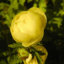
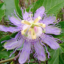
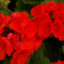
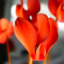
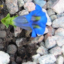
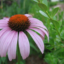

In [5]:
// Remove cached file to force regeneratrion.
!rm -f "${HOME}/work/oxfordflowers102/"*_cached_images_*

%%
c := ConfigFromFlags()
trainDS, validationDS := c.CreateInMemoryDatasets()

fmt.Println()
fmt.Printf("Total number of examples: #train=%d, #validation=%d\n", trainDS.NumExamples(), validationDS.NumExamples())
fmt.Printf("trainDS (in-memory) using %s of memory.\n", data.ByteCountIEC(trainDS.Memory()))
fmt.Printf("validationDS (in-memory) using %s of memory.\n", data.ByteCountIEC(validationDS.Memory()))

// Output a random sample.
trainDS.Shuffle()
sampleTable("Oxford 102 Flowers Sample -- In-Memory Dataset", trainDS, 1, 6)

## Denoising Diffusion Implicit Model

### Preprocessing of images

The diffusion model takes images in normalized to a mean of 0 and standard deviation of 1, and generates images in the same range.

The functions `PreprocessImage` and `DenormalizeImage` converts to floats and normalize/denormalize them.

Below we quickly test that calling `PreprocessImage` and then `DenormalizeImage` has no effect on a random batch of images.

Flower images, per channel (red, green, blue):
	  mean=[[[[121.027176 100.22015 78.19373]]]]
	stddev=[[[[75.55288 62.183628 69.93133]]]]
Creating InMemoryDataset for "train" with images cropped and scaled to 128x128...
	- 3.643369294s to process dataset.
Creating InMemoryDataset for "validation" with images cropped and scaled to 128x128...
	- 1.125553889s to process dataset.


Original:


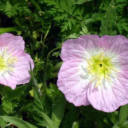
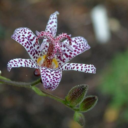
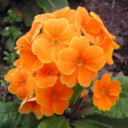
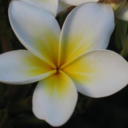
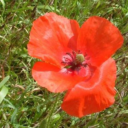
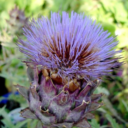

After normalization and denormalization:

imagesT.shape=(Float32)[6 128 128 3]



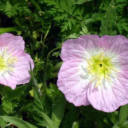
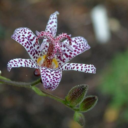
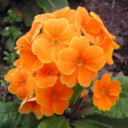
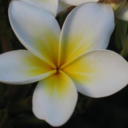
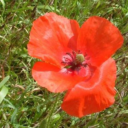
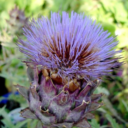

In [6]:
import (
    . "github.com/gomlx/gomlx/pkg/core/graph"
    "github.com/gomlx/gomlx/pkg/ml/context"
    "github.com/gomlx/gomlx/pkg/ml/datasets"
   "github.com/janpfeifer/gonb/gonbui"
)

var _ = NewGraph  // Avoid warnings of non-used import.

%% --set="image_size=128"
c := ConfigFromFlags()
mean, stddev := c.NormalizationValues()
fmt.Printf("Flower images, per channel (red, green, blue):\n\t  mean=%v\n\tstddev=%v\n", mean.Value(), stddev.Value())

trainDS, _ := c.CreateInMemoryDatasets()
trainDS.Shuffle()
trainDS.BatchSize(6, true)
_, inputs, _ := must.M3(trainDS.Yield())
gonbui.DisplayHTML("<p><b>Original:</b></p>")
diffusion.PlotImagesTensor(inputs[0])

e := NewExec(c.Backend, func(images *Node) *Node {
    images = c.PreprocessImages(images, true)
    images = c.DenormalizeImages(images)
    return images
})
gonbui.DisplayHTML("<p><b>After normalization and denormalization:</b></p>")
imagesT := e.Call(inputs[0])[0]
fmt.Printf("imagesT.shape=%s\n", imagesT.Shape())
diffusion.PlotImagesTensor(imagesT)

### Sinusoidal Embedding

Used to embed the variance of the noise at different frequencies.

In [7]:
import (
    "github.com/gomlx/gomlx/examples/oxfordflowers102/diffusion"
    . "github.com/gomlx/gomlx/pkg/core/graph"
)

%%
c := ConfigFromFlags()
value := NewExec(c.Backend, func (x *Node) *Node {
    return diffusion.SinusoidalEmbedding(c.Context, x)
}).Call(float32(1.0))[0]
fmt.Printf("SinusoidalEmbedding(1.0)=\n\tShape: %s\n\tValue: %v\n", value.Shape(), value.Value())

SinusoidalEmbedding(1.0)=
	Shape: (Float32)[32]
	Value: [1.7484555e-07 -0.5084644 -0.074616365 -0.11864995 0.93075866 2.70213e-06 -0.8129459 0.6793376 -0.92810476 0.5659511 1.176251e-05 0.06701087 0.9265504 0.62322754 -0.26391345 0.0007279766 1 -0.86108303 -0.9972123 0.99293613 -0.3656342 1 0.5823393 0.73382586 0.37231916 0.8244388 1 -0.99775225 0.37617072 0.7820406 0.9645464 0.99999976]


### [U-Net Model](https://arxiv.org/abs/1505.04597)

The code in [`diffusion.UNetModelGraph`](https://github.com/gomlx/gomlx/blob/main/examples/oxfordflowers102/diffusion/diffusion.go) follows the [Keras example's Network Architecture](https://keras.io/examples/generative/ddim/#network-architecture).

The following the modeling functions:

* `UNetModelGraph` builds a _noisy image_  to _(predicted image, predicted noise)_ computation graph, using U-Net model, it's the core of this example.
* `BuildTrainingModelGraph` builds the `train.ModelFn` (the function that GoMLX uses for a training loop). It takes raw images as examples, adds some random noise, at a random _time_ (from 0.0 to 1.0), and uses the U-Net model to try to separate the noise. It returns the _predicted image_ and the _loss_, where the _loss_ is measured on the _predicted noise_ -- it is better for learning than predicting the original image (*)

(*) My hypothesis is that predicting the original image is easier to overfit (since we have a limited number of images, but infinite noises we can generate).

The model in its default configuration uses ~3.5 million parameters:


In [8]:
import (
    . "github.com/gomlx/gomlx/pkg/core/graph"
    "github.com/gomlx/gomlx/pkg/ml/context"
    "github.com/gomlx/gomlx/pkg/core/shapes"
    "github.com/gomlx/gomlx/pkg/core/dtypes"
)

// batch_size=5 just for testing.
%% --set="flower_type_embed_size=16;batch_size=5"
c := ConfigFromFlags()
fmt.Printf("Backend %q: %s\n", c.Backend.Name(), c.Backend.Description())

fmt.Println("\nUNetModelGraph:")
g := NewGraph(c.Backend, "test")
noisyImages := Zeros(g, shapes.Make(c.DType, c.BatchSize, 64, 64, 3))
flowerIds := Zeros(g, shapes.Make(dtypes.Int32, c.BatchSize))
fmt.Printf("  noisyImages.shape:\t%s\n", noisyImages.Shape())
filtered := diffusion.UNetModelGraph(c.Context, noisyImages, Ones(g, shapes.Make(c.DType, 5, 1, 1, 1)), flowerIds)
fmt.Printf("     filtered.shape:\t%s\n", filtered.Shape())
fmt.Printf("U-Net Model #params:\t%d\n", c.Context.NumParameters())
fmt.Printf(" U-Net Model memory:\t%s\n", data.ByteCountIEC(c.Context.Memory()))

fmt.Println("\nModelGraph:")
images := Zeros(g, shapes.Make(c.DType, 5, c.ImageSize, c.ImageSize, 3))
fmt.Printf("         images.shape:\t%s\n", images.Shape())
modelFn := c.BuildTrainingModelGraph()
predictions := modelFn(c.Context.Reuse(), nil, []*Node{images, nil, flowerIds})
fmt.Printf("predictedImages.shape:\t%s\n", predictions[0].Shape())
fmt.Printf("           loss.shape:\t%s\n", predictions[1].Shape())
fmt.Printf("        Model #params:\t%d\n", c.Context.NumParameters())
fmt.Printf("         Model memory:\t%s\n", data.ByteCountIEC(c.Context.Memory()))

Backend "xla": xla:cuda - PJRT "cuda" plugin (/usr/local/lib/gomlx/pjrt/pjrt_c_api_cuda_plugin.so) v0.54

UNetModelGraph:
  noisyImages.shape:	(Float32)[5 64 64 3]
     filtered.shape:	(Float32)[5 64 64 3]
U-Net Model #params:	4400646
 U-Net Model memory:	16.8 MiB

ModelGraph:
         images.shape:	(Float32)[5 64 64 3]
predictedImages.shape:	(Float32)[5 64 64 3]
           loss.shape:	(Float32)
        Model #params:	4400646
         Model memory:	16.8 MiB


## Training Model

The training was mostly done from the command line -- easier to leave it running for hours -- using the `train` program.

It can be installed with `go install github.com/gomlx/gomlx/examples/oxfordflowers102/diffusion/train@latest`, but usually
I would just go to the directory and do a `go run . <...flags...>`, see some examples below.
It does also requires [github.com/gomlx/gopjrt](https://github.com/gomlx/gopjrt) installed with the PJRT plugins 
for your device (CPU, GPU, etc.).

The `train` program (and the library function) saves evaluation points as it is training, and these can be plotted, see below for an example. 
If the training is interrupted and restarted, it continues where it left of.

See also [github.com/gomlx/gomlx/cmd/gomlx_checkpoints](https://github.com/gomlx/gomlx/tree/main/cmd/gomlx_checkpoints) to pretty-print the metrics, a model summary, its variables and its hyperparameters from the command line.

During the writing of this notebook, a few such models were generated, with different hyperparameters. But the space was not explored a lot -- if someone with more GPU available is willing to try some hyperaparameter tuning or have a better diffusion model to use, please share!

### Training from the notebook

Because it takes many hours, we recommend training from the command line. But it can be done from the notebook as well -- it uses the same training function -- which can be useful for testing and development.


In [9]:
!rm -rf ~/work/oxfordflowers102/test/

In [10]:
%% --checkpoint "test" --set="train_steps=2000;plots=true;diffusion_num_residual_blocks=2"
c := ConfigFromFlags()
fmt.Printf("Backend %q: %s\n", c.Backend.Name(), c.Backend.Description())
diffusion.TrainModel(c.Context, *flagDataDir, *flagCheckpoint, c.ParamsSet, *flagEval, *flagVerbosity)

Backend "xla": xla:cuda - PJRT "cuda" plugin (/usr/local/lib/gomlx/pjrt/pjrt_c_api_cuda_plugin.so) v0.54
Backend "xla":	xla:cuda - PJRT "cuda" plugin (/usr/local/lib/gomlx/pjrt/pjrt_c_api_cuda_plugin.so) v0.54
	Checkpoint: "/home/janpf/work/oxfordflowers102/test"
	train_steps=2000
	plots=true
	diffusion_num_residual_blocks=2


Training (2000 steps):   36% [=============>..........................] (12 steps/s) 51s:1m46s] [step=727] [loss+=0.200] [~loss+=0.208] [~loss=0.208] [~img_loss=0.210] [~fast_loss=0.207] [~mae=0.207]        

Training (2000 steps):  100% [========================================] (8 steps/s) [step=1999] [loss+=0.176] [~loss+=0.194] [~loss=0.194] [~img_loss=0.201] [~fast_loss=0.192] [~mae=0.192]           
	[Step 2000] median train step: 83166 microseconds

Results on train:
	Mean Loss+Regularization (#loss+): 0.195
	Mean Loss (#loss): 0.195
	Images Loss (img_loss): 0.195
	MAE Loss (#mae): 0.195
Results on validation:
	Mean Loss+Regularization (#loss+): 0.194
	Mean Loss (#loss): 0.194
	Images Loss (img_loss): 0.195
	MAE Loss (#mae): 0.194


## Generating images from a model

To generate images, we build and execute the model on various step. Each assuming less noise and more signal. It starts with purely randomly generated noise.

The function `GenerateImages(numImages, numSteps, displayEveryNSteps)` orchestrate this for us.

This only works with a trained model saved to a checkpoint.

The `"use_ema=true"` hyperparameter tells it to use an expoential moving average (ema) of the weights for evaluation (it requires the model to have been trained with it enabled).

	Checkpoint: "/home/janpf/work/oxfordflowers102/v2_64x64"
DisplayImagesAcrossDiffusionSteps(12 images, 20 steps): noise.shape=(Float32)[12 64 64 3]
	Model #params:	6841702
	 Model memory:	26.1 MiB


Noise


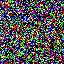
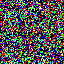
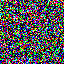
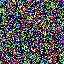
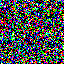
...
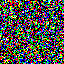
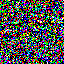
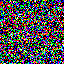
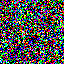
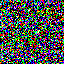

5.0% Denoised -- Step 1/20


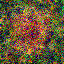
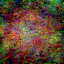
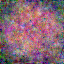
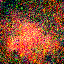
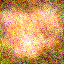
...
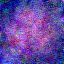
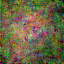
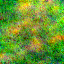
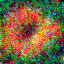
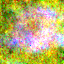

55.0% Denoised -- Step 11/20


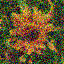
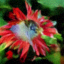
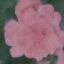
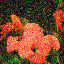
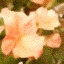
...
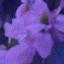
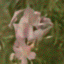
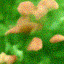
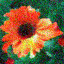
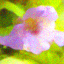

100.0% Denoised -- Step 20/20


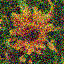
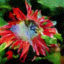
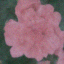
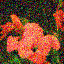
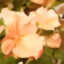
...
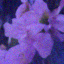
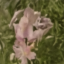
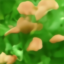
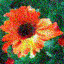
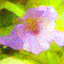

In [4]:
%% --checkpoint="v2_64x64" -set="use_ema=true"
c := ConfigFromFlags()
_, _, _ = c.AttachCheckpoint(*flagCheckpoint)
c.DisplayImagesAcrossDiffusionSteps(12, 20, 10)

### Generating 102 Images For Each Flower Type, Same Noise

Notice our current model is not very good yet: it's +/- the same image.

	Checkpoint: "/home/janpf/work/oxfordflowers102/v2_64x64"



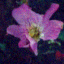
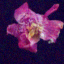
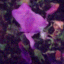
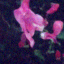
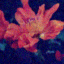
...
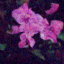
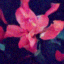
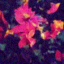
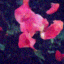
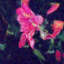

In [5]:
%% --checkpoint="v2_64x64" --set="use_ema=true"
c := ConfigFromFlags()
_, _, _ = c.AttachCheckpoint(*flagCheckpoint)
diffusion.PlotImagesTensor(c.GenerateImagesOfAllFlowerTypes(20))

### Fixed starting noise, generated flower at different points in training

At the start of each new model, the `diffusion.TrainModel()` function saves a set of random noise, and every time that the model is evaluated, images at the corresponding checkpoint at generated using these fixed noise. This way one can see how the odel training evaluates. 

Below is the list of images generated by our `v5_64x64` at various steps during training:

	Checkpoint: "/home/janpf/work/oxfordflowers102/v2_64x64"


**Generated samples in `/home/janpf/work/oxfordflowers102/v2_64x64`:**


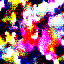
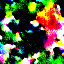
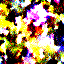
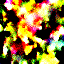
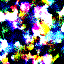
...
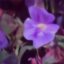
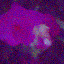
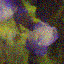
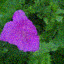
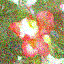

In [6]:
%% --checkpoint="v2_64x64"
c := ConfigFromFlags()
_, _, _ = c.AttachCheckpoint(*flagCheckpoint)
c.PlotModelEvolution(20, /* animated */ true)

### Sample generated images per flower type

For a sample of flower types, generate 20 images for each.

Definitely, not as good as the one from the previous version, displayed at the bottom.

	Checkpoint: "/home/janpf/work/oxfordflowers102/v2_64x64"


Generated prince of wales feathers


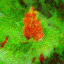
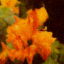
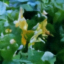
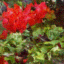
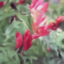
...
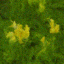
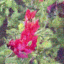
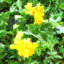
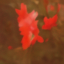
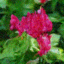

Generated morning glory


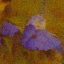
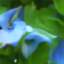
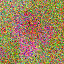
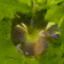
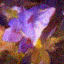
...
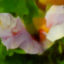
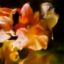
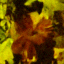
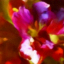
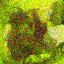

Generated columbine


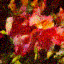
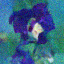
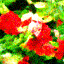
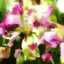
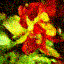
...
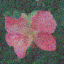
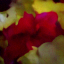
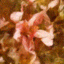
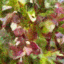
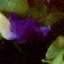

Generated columbine


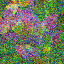
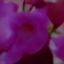
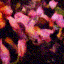
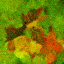
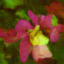
...
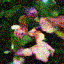
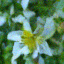
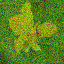
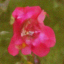
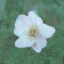

Generated cyclamen


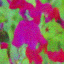
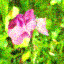
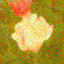
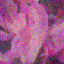
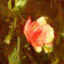
...
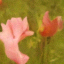
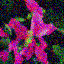
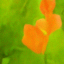
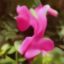
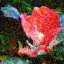

In [7]:
import flowers "github.com/gomlx/gomlx/examples/oxfordflowers102"

%% --checkpoint="v2_64x64"
c := ConfigFromFlags()
_, _, _ = c.AttachCheckpoint(*flagCheckpoint)
for ii := 0; ii < 5; ii++ {
    flowerType := int32(rand.Intn(flowers.NumLabels))
    gonbui.DisplayHTML(fmt.Sprintf("<p>Generated <b>%s</b></p>\n", flowers.Names[flowerType]))
    diffusion.PlotImagesTensor(c.GenerateImagesOfFlowerType(12, flowerType, 30))
}

## Older Version

Below are results using an older version of GoMLX: the models trained then were better, but I didn't retrain them on the newer version. 

**TODO: improve them either with more training time, more hyperparameter tuning or a better model.**

### Larger 128x128 model with Transformer blocks

Belwo some random images generated by a model trained with 128x128, with more blocks and in the middle with 4 attention layers.

Also I tried the _mean squared loss_ function.


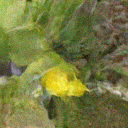
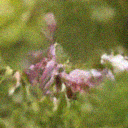
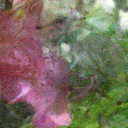
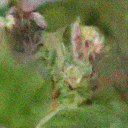
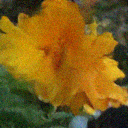
...
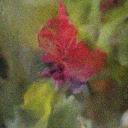
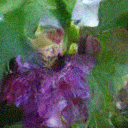
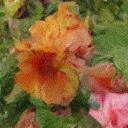
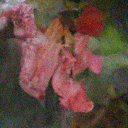
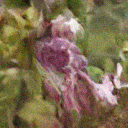

In [22]:
%% --checkpoint="model_128x128_01" --size=128 --att_layers=4 --blocks=6 --norm=layer --activation=sigmoid --channels_list=16,32,64,96,128 --loss=mse --checkpoint_mean=-1
diffusion.PlotImagesTensor(diffusion.GenerateImages(90, 20, 0))

### Model conditioned on flower types

The flag `--flower_type_dim=16` will use the flower type (`flowerIds`) as a feature, and embed it with the given dimension at the start of each block.

We trained the model `model_64x64_02` with 200K steps using this flag:

```bash
$ go run . --steps=200000 --plots --checkpoint="model_64x64_02" --norm=layer --learning_rate=1e-3 --flower_type_dim=16
```

Below the generation output for a few random examples for a few random flower types:

Generated gazania


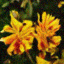
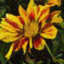
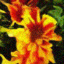
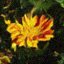
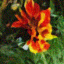
...
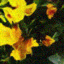
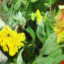
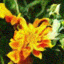
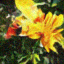
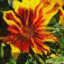

Generated lotus


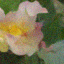
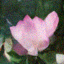
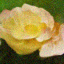
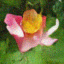
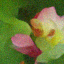
...
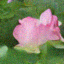
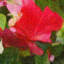
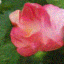
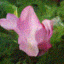
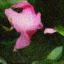

Generated alpine sea holly


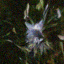
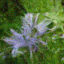
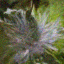
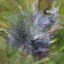
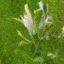
...
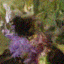
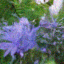
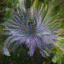
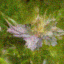
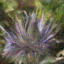

Generated wallflower


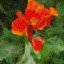
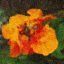
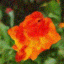
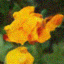
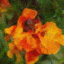
...
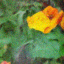
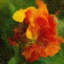
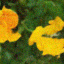
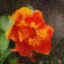
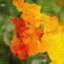

Generated thorn apple


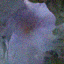
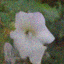
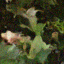
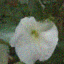
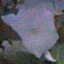
...
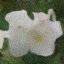
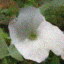
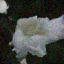
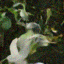
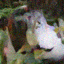

In [8]:
%% --checkpoint="model_64x64_02" --norm=layer --learning_rate=1e-3 --flower_type_dim=16  --checkpoint_mean=-1
for ii := 0; ii < 5; ii++ {
    flowerType := int32(rand.Intn(flowers.NumLabels))
    gonbui.DisplayHTML(fmt.Sprintf("<p>Generated <b>%s</b></p>\n", flowers.Names[flowerType]))
    diffusion.PlotImagesTensor(diffusion.GenerateImagesOfFlowerType(18, flowerType, 30))
}

#### One starting noise, different flower types


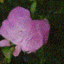
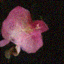
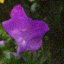
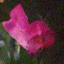
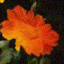
...
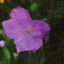
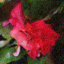
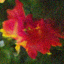
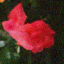
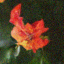

In [9]:
%% --checkpoint="model_64x64_02" 
c := ConfigFromFlags()
_, _, _ = c.AttachCheckpoint(*flagCheckpoint)
diffusion.PlotImagesTensor(c.GenerateImagesOfAllFlowerTypes(20))

In [ ]:
%% --checkpoint="model_64x64_02" --norm=layer --learning_rate=1e-3 --flower_type_dim=16  --checkpoint_mean=-1
// Load model
ctx := context.NewContext(manager).Checked(false)
_, _, _ = diffusion.LoadCheckpointToContext(ctx)
ctx.RngStateReset()

// Create UI with diffusion generated flowers.
divId := dom.CreateTransientDiv()
// cache.ResetKey("slider_diffusion_steps")
doneSteps := diffusion.SliderDiffusionSteps("slider_diffusion_steps", ctx, 8, 30, divId)
// cache.ResetKey("dropdown_flower_types")
doneFlowers := diffusion.DropdownFlowerTypes("dropdown_flower_types", ctx, 8, 20, divId)

// Wait for OK button.
button := widgets.Button("Ok").AppendTo(divId).Done()
<-button.Listen().C

// Clean up and persist HTML (so it can be saved).
doneSteps.Trigger()
doneFlowers.Trigger()
dom.Persist(divId)


In [7]:
%% --checkpoint="model_64x64_02" --norm=layer --learning_rate=1e-3 --flower_type_dim=16  --checkpoint_mean=-1
// Load model
ctx := context.NewContext(manager).Checked(false)
_, _, _ = diffusion.LoadCheckpointToContext(ctx)

// Create UI with diffusion generated flowers.
divId := dom.CreateTransientDiv()
diffusion.SliderDiffusionSteps("slider_diffusion_steps", ctx, 8, 30, divId)
diffusion.DropdownFlowerTypes("dropdown_flower_types", ctx, 8, 20, divId)

// Wait for OK button.
button := widgets.Button("Ok").AppendTo(divId).Done()
<-button.Listen().C